### Notebook to identify and visualise gene markers for Epithelial cells 

- **Developed by**: Carlos Talavera-López Ph.D
- **Institute of Computational Biology - Computational Health Centre - Helmholtz Munich**
- v230223

### Import required modules

In [1]:
import anndata
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
from bioservices import KEGG
import matplotlib.pyplot as plt

### Set up working environment

In [2]:
sc.settings.verbosity = 1
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma', dpi_save = 300, vector_friendly = True, format = 'svg')

/var/folders/rx/f17v355x1xqdpm4hlmym_zvw0000gn/T/ipykernel_51474/2564240278.py:2: FutureWarning: Use `print_header` instead
  sc.logging.print_versions()


### Read in Healthy-CTRL dataset

In [4]:
BrEpit_ALL = sc.read_h5ad('../data/Marburg_cell_states_locked_ctl240504.raw.h5ad') 
BrEpit_ALL

AnnData object with n_obs × n_vars = 97573 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', 'IAV_score', 'group', 'Viral_score', 'cell_type', 'cell_states', 'leiden', 'cell_compartment', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'viral_counts', 'infected_status', 'seed_labels', 'batch-scANVI'
    var: 'mt', 'ribo'
    uns: 'cell_compartment_colors', 'cell_states_colors', 'disease_colors', 'group_colors', 'infection_colors'
    obsm: 'X_scANVI', 'X_umap'

### Visualise manifold with `scANVI` annotation

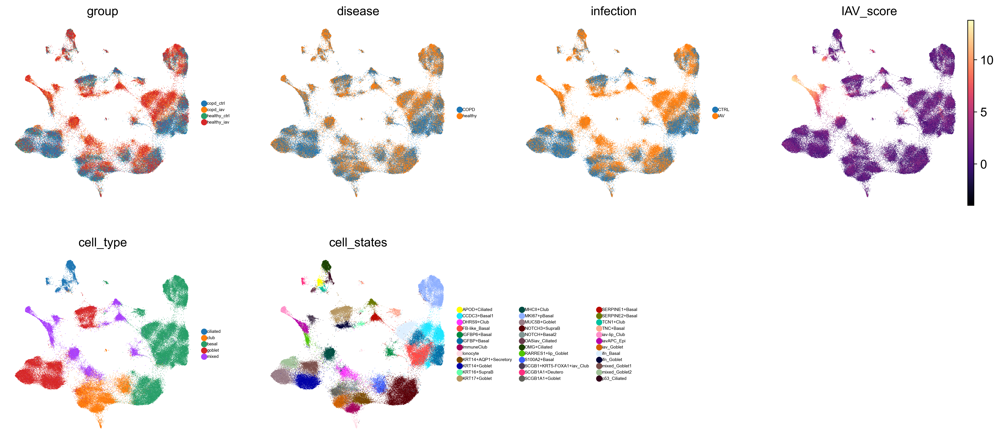

In [5]:
sc.pl.umap(BrEpit_ALL, frameon = False, color = ['group', 'disease', 'infection', 'IAV_score', 'cell_type', 'cell_states'], size = 1, legend_fontsize = 5, ncols = 4)

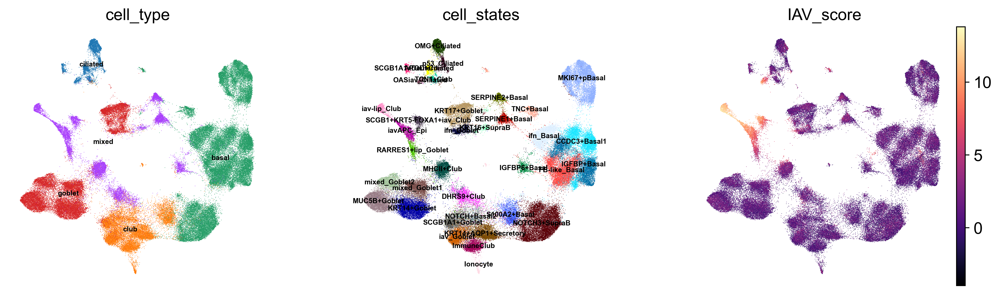

In [6]:
sc.pl.umap(BrEpit_ALL, frameon = False, color = ['cell_type', 'cell_states', 'IAV_score'], size = 0.8, legend_fontsize = 6, ncols = 4, legend_loc = 'on data')

### Calculate marker genes 

In [7]:
adata_log = anndata.AnnData(X = BrEpit_ALL.X,  var = BrEpit_ALL.var, obs = BrEpit_ALL.obs, obsm = BrEpit_ALL.obsm)
sc.pp.normalize_total(adata_log, target_sum = 1e6, exclude_highly_expressed = True)
sc.pp.log1p(adata_log)
adata_log.layers["sqrt_norm"] = np.sqrt(
    sc.pp.normalize_total(adata_log, inplace = False)["X"]
)

### Check CXCL11 markers

In [8]:
markers = ['CXCL11']

/Users/cartalop/miniforge3/envs/scanpy/lib/python3.10/site-packages/scanpy/tools/_utils.py:40: UserWarning: You’re trying to run this on 27208 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(
/Users/cartalop/miniforge3/envs/scanpy/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:379: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca
/Users/cartalop/miniforge3/envs/scanpy/lib/python3.10/site-packages/scanpy/tools/_utils.py:40: UserWarning: You’re trying to run this on 27208 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(
/Users/cartalop/miniforge3/envs/scanpy/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:379: ImplicitModificationWarning: Setting element `.

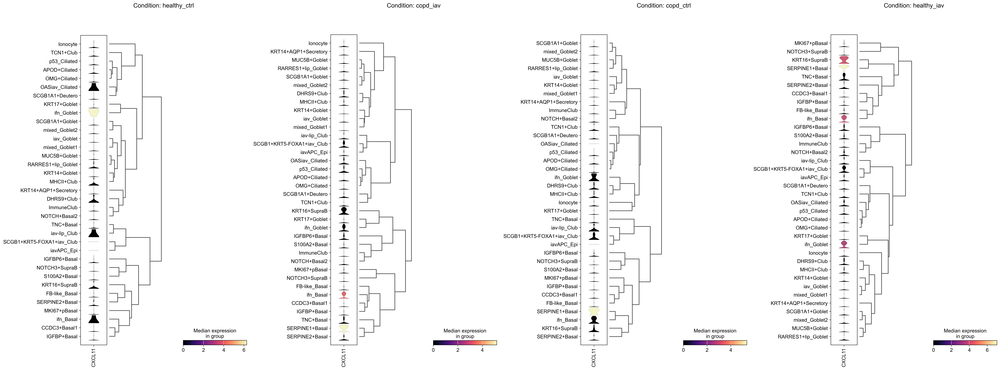

In [10]:
import matplotlib.pyplot as plt

# Get unique conditions
conditions = adata_log.obs['group'].unique()

# Create a subplot for each condition
fig, axes = plt.subplots(1, len(conditions), figsize=(8*len(conditions), 12))

for idx, condition in enumerate(conditions):
    # Subset the data for the current condition
    adata_subset = adata_log[adata_log.obs['group'] == condition]
    
    # Recompute dendrogram for this subset
    sc.tl.dendrogram(adata_subset, groupby='cell_states')
    
    # Create the violin plot
    sc.pl.stacked_violin(adata_subset, markers, groupby='cell_states', 
                        dendrogram=True, cmap='magma', 
                        ax=axes[idx], show=False)
    axes[idx].set_title(f'Condition: {condition}')

plt.tight_layout()
plt.show()

/Users/cartalop/miniforge3/envs/scanpy/lib/python3.10/site-packages/scanpy/tools/_utils.py:40: UserWarning: You’re trying to run this on 27208 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(
/Users/cartalop/miniforge3/envs/scanpy/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:379: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca
/Users/cartalop/miniforge3/envs/scanpy/lib/python3.10/site-packages/scanpy/tools/_utils.py:40: UserWarning: You’re trying to run this on 27208 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(
/Users/cartalop/miniforge3/envs/scanpy/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:379: ImplicitModificationWarning: Setting element `.

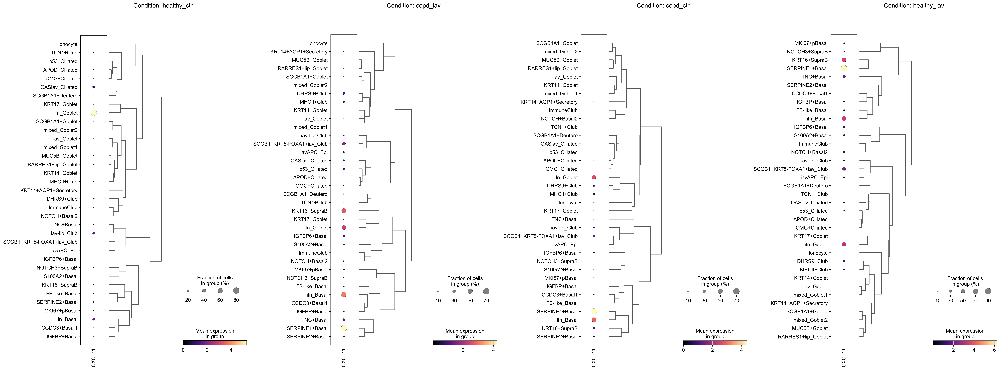

In [11]:
import matplotlib.pyplot as plt

# Get unique conditions
conditions = adata_log.obs['group'].unique()

# Create a subplot for each condition
fig, axes = plt.subplots(1, len(conditions), figsize=(8*len(conditions), 12))

for idx, condition in enumerate(conditions):
    # Subset the data for the current condition
    adata_subset = adata_log[adata_log.obs['group'] == condition]
    
    # Recompute dendrogram for this subset
    sc.tl.dendrogram(adata_subset, groupby='cell_states')
    
    # Create the dot plot
    sc.pl.dotplot(adata_subset, markers, groupby='cell_states', 
                 dendrogram=True, cmap='magma', 
                 ax=axes[idx], show=False)
    axes[idx].set_title(f'Condition: {condition}')

plt.tight_layout()
plt.show()

### Visualise marker genes for senescense

In [ ]:
adata_log.obs['cell_states'].cat.categories

In [ ]:
markers = ['ACVR1B', 'ANG', 'ANGPT1', 'ANGPTL4', 'AREG', 'AXL', 'BEX3', 'BMP2', 'BMP6', 'C3', 'CCL16', 'CCL2', 'CCL20', 'CCL26', 'CCL3', 'CCL4', 'CCL5', 'CCL8', 'CD55', 'CD9', 'CSF1', 'CSF2', 'CST4', 'CTNNB1', 'CTSB', 'CXCL1', 'CXCL10', 'CXCL12', 'CXCL16', 'CXCL2', 'CXCL3', 'CXCL8', 'CXCR2', 'DKK1', 'EDN1', 'EGF', 'EGFR', 'EREG', 'ESM1', 'ETS2', 'FAS', 'FGF1', 'FGF2', 'FGF7', 'GDF15', 'GEM', 'GMFG', 'HGF', 'HMGB1', 'ICAM1', 'ICAM3', 'IGF1', 'IGFBP1', 'IGFBP2', 'IGFBP3', 'IGFBP4', 'IGFBP5', 'IGFBP6', 'IGFBP7', 'IL10', 'IL13', 'IL15']
sc.pl.stacked_violin(adata_log, markers, groupby = 'cell_states', dendrogram = True, cmap = 'magma')

In [ ]:
mayo_list = ['ACVR1B', 'ANG', 'ANGPT1', 'ANGPTL4', 'AREG', 'AXL', 'BEX3', 'BMP2', 'BMP6', 'C3', 'CCL16', 'CCL2', 'CCL20', 'CCL26', 'CCL3', 'CCL4', 'CCL5', 'CCL8', 'CD55', 'CD9', 'CSF1', 'CSF2', 'CST4', 'CTNNB1', 'CTSB', 'CXCL1', 'CXCL10', 'CXCL12', 'CXCL16', 'CXCL2', 'CXCL3', 'CXCL8', 'CXCR2', 'DKK1', 'EDN1', 'EGF', 'EGFR', 'EREG', 'ESM1', 'ETS2', 'FAS', 'FGF1', 'FGF2', 'FGF7', 'GDF15', 'GEM', 'GMFG', 'HGF', 'HMGB1', 'ICAM1', 'ICAM3', 'IGF1', 'IGFBP1', 'IGFBP2', 'IGFBP3', 'IGFBP4', 'IGFBP5', 'IGFBP6', 'IGFBP7', 'IL10', 'IL13', 'IL15']
sc.tl.score_genes(BrEpit_ALL, mayo_list, score_name = 'Mayo_list_Score', use_raw = False)
adata_log.obs['Mayo_list_Score'] = BrEpit_ALL.obs['Mayo_list_Score'].copy()
sc.pl.umap(adata_log, frameon = False, color = ['disease', 'infection', 'IAV_score', 'Mayo_list_Score', 'cell_states'], size = 0.6, legend_fontsize = 5, ncols = 3, layer = 'sqrt_norm', cmap = 'magma')

In [ ]:
sc.pl.umap(adata_log, frameon = False, color = ['disease', 'infection', 'IAV_score', 'Mayo_list_Score', 'cell_type'], size = 0.7, legend_fontsize = 5, ncols = 3, layer = 'sqrt_norm', cmap = 'magma')

- Friedman up 

In [ ]:
fridman_senescence_up = ['ALDH1A3', 'AOPEP', 'CCN2', 'CCND1', 'CD44', 'CDKN1A', 'CDKN1C', 'CDKN2A', 'CDKN2B', 'CDKN2D', 'CITED2', 'CLTB', 'COL1A2', 'CREG1', 'CRYAB', 'CXCL14', 'CYP1B1', 'EIF2S2', 'ESM1', 'F3', 'FILIP1L', 'FN1', 'GSN', 'GUK1', 'HBS1L', 'HPS5', 'HSPA2', 'HTATIP2', 'IFI16', 'IFNG', 'IGFBP1', 'IGFBP2', 'IGFBP3', 'IGFBP4', 'IGFBP5', 'IGFBP6', 'IGFBP7', 'IGSF3', 'ING1', 'IRF5', 'IRF7', 'ISG15', 'MAP1LC3B', 'MAP2K3', 'MDM2', 'MMP1', 'NDN', 'NME2', 'NRG1', 'OPTN', 'PEA15', 'RAB13', 'RAB31', 'RAB5B', 'RABGGTA', 'RAC1', 'RBL2', 'RGL2', 'RHOB', 'RRAS', 'S100A11', 'SERPINB2', 'SERPINE1', 'SMPD1', 'SMURF2', 'SOD1', 'SPARC', 'STAT1', 'TES', 'TFAP2A', 'TGFB1I1', 'THBS1', 'TNFAIP2', 'TNFAIP3', 'TP53', 'TSPYL5', 'VIM']
sc.tl.score_genes(BrEpit_ALL, fridman_senescence_up, score_name = 'Fridman_UP_Score', use_raw = False)
adata_log.obs['Fridman_UP_Score'] = BrEpit_ALL.obs['Fridman_UP_Score'].copy()
sc.pl.umap(adata_log, frameon = False, color = ['disease', 'infection', 'IAV_score', 'Fridman_UP_Score', 'cell_states'], size = 0.6, legend_fontsize = 5, ncols = 3, layer = 'sqrt_norm', cmap = 'magma')

In [ ]:
sc.pl.umap(adata_log, frameon = False, color = ['disease', 'infection', 'IAV_score', 'Fridman_UP_Score', 'cell_type'], size = 0.7, legend_fontsize = 5, ncols = 3, layer = 'sqrt_norm', cmap = 'magma')

- Fridman down

In [ ]:
fridman_senescence_down = ['ALDH1A1','BMI1','CCN4','CCNB1','CDC25B','CKS1BP7','COL3A1','E2F4','EGR1','ID1','LAMA1','LDB2','MARCKS']
sc.tl.score_genes(BrEpit_ALL, fridman_senescence_down, score_name = 'Fridman_DOWN_Score', use_raw = False)
adata_log.obs['Fridman_DOWN_Score'] = BrEpit_ALL.obs['Fridman_DOWN_Score'].copy()
sc.pl.umap(adata_log, frameon = False, color = ['disease', 'infection', 'IAV_score', 'Fridman_DOWN_Score', 'cell_states'], size = 0.6, legend_fontsize = 5, ncols = 3, layer = 'sqrt_norm', cmap = 'magma')

In [ ]:
sc.pl.umap(adata_log, frameon = False, color = ['disease', 'infection', 'IAV_score', 'Fridman_DOWN_Score', 'cell_type'], size = 0.7, legend_fontsize = 5, ncols = 3, layer = 'sqrt_norm', cmap = 'magma')

In [ ]:
sc.pl.dotplot(adata_log, markers, groupby = 'leiden_states', layer = 'sqrt_norm', cmap = 'magma')

In [ ]:
sc.pl.umap(adata_log, frameon = False, color = ['leiden_states', 'IAV_score', 'KRT5', 'KRT17', 'ACTB', 'SCGB1A1'], size = 0.5, legend_fontsize = 5, ncols = 3, legend_loc = 'on data', layer = 'sqrt_norm', cmap = 'magma')

In [ ]:
markers = ['SERPINE1', 'SERPINE2', 'PMEPA1', 'AMIGO2', 'LGALS1', 'MYL9', 'DKK3', 'MMP2']
sc.pl.stacked_violin(adata_log, markers, groupby = 'group', dendrogram = True, cmap = 'RdPu')

In [ ]:
markers = ['TWIST1', 'FOXC2', 'SNAI1', 'VIM', 'FGFR1']
sc.pl.stacked_violin(adata_log, markers, groupby = 'group', dendrogram = True, cmap = 'RdPu')

In [ ]:
markers = ['TWIST1', 'FOXC2', 'SNAI1', 'VIM', 'FGFR1']
sc.pl.stacked_violin(adata_log, markers, groupby = 'disease', dendrogram = True, cmap = 'RdPu')

In [ ]:
markers = ['TWIST1', 'FOXC2', 'SNAI1', 'VIM', 'FGFR1']
sc.pl.stacked_violin(adata_log, markers, groupby = 'infection', dendrogram = True, cmap = 'RdPu')

In [ ]:
markers = ['TWIST1', 'FOXC2', 'SNAI1', 'VIM', 'FGFR1', 'FN1']
sc.pl.stacked_violin(adata_log, markers, groupby = 'leiden_states', dendrogram = True, cmap = 'RdPu')

### Calculate expression scores

- KEGG Influenza A signature

In [ ]:
kegg = KEGG()
pathway = kegg.get('hsa05164')
genes = kegg.parse(pathway)

gene_list = [desc.split(';')[0] for desc in genes['GENE'].values()]
gene_list

In [ ]:
sc.tl.score_genes(BrEpit_ALL, gene_list, score_name = 'KEGG-IAV_Score', use_raw = False)
adata_log.obs['KEGG-IAV_Score'] = BrEpit_ALL.obs['KEGG-IAV_Score'].copy()
sc.pl.umap(adata_log, frameon = False, color = ['leiden_states', 'IAV_score', 'KEGG-IAV_Score'], size = 0.5, legend_fontsize = 5, ncols = 3, legend_loc = 'on data', layer = 'sqrt_norm', cmap = 'magma')

- KEGG Interferon alpha

In [ ]:
kegg = KEGG()
pathway = kegg.get('hsa04630')
genes = kegg.parse(pathway)

gene_list = [desc.split(';')[0] for desc in genes['GENE'].values()]
gene_list

In [ ]:
sc.tl.score_genes(BrEpit_ALL, gene_list, score_name = 'IFNab_Score', use_raw = False)
adata_log.obs['IFNab_Score'] = BrEpit_ALL.obs['IFNab_Score'].copy()
sc.pl.umap(adata_log, frameon = False, color = ['leiden_states', 'IAV_score', 'KEGG-IAV_Score', 'IFNab_Score'], size = 0.5, legend_fontsize = 5, ncols = 3, legend_loc = 'on data', layer = 'sqrt_norm', cmap = 'magma')

- KEGG interferon gamma

In [ ]:
kegg = KEGG()
pathway = kegg.get('hsa04622')
genes = kegg.parse(pathway)

gene_list = [desc.split(';')[0] for desc in genes['GENE'].values()]
gene_list

In [ ]:
sc.tl.score_genes(BrEpit_ALL, gene_list, score_name = 'IFNg_Score', use_raw = False)
adata_log.obs['IFNg_Score'] = BrEpit_ALL.obs['IFNg_Score'].copy()
sc.pl.umap(adata_log, frameon = False, color = ['leiden_states', 'IAV_score', 'KEGG-IAV_Score', 'IFNab_Score', 'IFNg_Score'], size = 0.5, legend_fontsize = 5, ncols = 3, legend_loc = 'on data', layer = 'sqrt_norm', cmap = 'magma')

- KEGG IL-1

In [ ]:
kegg = KEGG()
pathway = kegg.get('hsa04668')
genes = kegg.parse(pathway)

gene_list = [desc.split(';')[0] for desc in genes['GENE'].values()]
gene_list

In [ ]:
sc.tl.score_genes(BrEpit_ALL, gene_list, score_name = 'IL1_Score', use_raw = False)
adata_log.obs['IL1_Score'] = BrEpit_ALL.obs['IL1_Score'].copy()
sc.pl.umap(adata_log, frameon = False, color = ['leiden_states', 'IAV_score', 'KEGG-IAV_Score', 'IFNab_Score', 'IFNg_Score', 'IL1_Score'], size = 0.5, legend_fontsize = 5, ncols = 3, legend_loc = 'on data', layer = 'sqrt_norm', cmap = 'magma')

### Calculate cluster-specific marker genes using _Wilcoxon's Rank Sum Test_

In [ ]:
sc.tl.rank_genes_groups(adata_log, 'leiden_states', method = 'wilcoxon', n_genes = 100, use_raw = False)
result = adata_log.uns['rank_genes_groups']
groups = result['names'].dtype.names
wilcox_markers = pd.DataFrame(
{group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names','logfoldchanges', 'pvals_adj']})
wilcox_markers.head(10)

### Visualise marker genes

In [ ]:
sc.pl.rank_genes_groups_dotplot(adata_log, n_genes = 5, cmap = 'magma')

### Calculate marker genes per condition

- Split dataset by condition

In [ ]:
healthy_ctrl_log = adata_log[adata_log.obs['group'].isin(['healthy_ctrl'])]
healthy_ctrl_log 

In [ ]:
sc.tl.rank_genes_groups(healthy_ctrl_log, 'leiden_states', method = 'wilcoxon', n_genes = healthy_ctrl_log.shape[1], use_raw = False)
result = healthy_ctrl_log.uns['rank_genes_groups']
groups = result['names'].dtype.names
wilcox_markers = pd.DataFrame(
{group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names','logfoldchanges', 'pvals_adj']})
wilcox_markers.head(10)

In [ ]:
sc.pl.rank_genes_groups_dotplot(healthy_ctrl_log, n_genes = 5, values_to_plot = 'scores', cmap = 'coolwarm')

In [ ]:
sc.pl.rank_genes_groups_dotplot(healthy_ctrl_log, n_genes = 5, values_to_plot = 'logfoldchanges', cmap = 'coolwarm')

In [ ]:
healthy_iav_log = adata_log[adata_log.obs['group'].isin(['healthy_iav'])]
healthy_iav_log 

In [ ]:
sc.tl.rank_genes_groups(healthy_iav_log, 'leiden_states', method = 'wilcoxon', n_genes = healthy_iav_log.shape[1], use_raw = False)
result = healthy_iav_log.uns['rank_genes_groups']
groups = result['names'].dtype.names
wilcox_markers = pd.DataFrame(
{group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names','logfoldchanges', 'pvals_adj']})
wilcox_markers.head(10)

In [ ]:
sc.pl.rank_genes_groups_dotplot(healthy_iav_log, n_genes = 5, values_to_plot = 'scores', cmap = 'coolwarm')

In [ ]:
sc.pl.rank_genes_groups_dotplot(healthy_iav_log, n_genes = 5, values_to_plot = 'logfoldchanges', cmap = 'coolwarm')

In [ ]:
copd_ctrl_log = adata_log[adata_log.obs['group'].isin(['copd_ctrl'])]
copd_ctrl_log 

In [ ]:
sc.tl.rank_genes_groups(copd_ctrl_log, 'leiden_states', method = 'wilcoxon', n_genes = healthy_iav_log.shape[1], use_raw = False)
result = copd_ctrl_log.uns['rank_genes_groups']
groups = result['names'].dtype.names
wilcox_markers = pd.DataFrame(
{group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names','logfoldchanges', 'pvals_adj']})
wilcox_markers.head(10)

In [ ]:
sc.pl.rank_genes_groups_dotplot(copd_ctrl_log, n_genes = 5, values_to_plot = 'scores', cmap = 'coolwarm')

In [ ]:
sc.pl.rank_genes_groups_dotplot(copd_ctrl_log, n_genes = 5, values_to_plot = 'logfoldchanges', cmap = 'coolwarm')

In [ ]:
copd_iav_log = adata_log[adata_log.obs['group'].isin(['copd_iav'])]
copd_iav_log 

In [ ]:
sc.tl.rank_genes_groups(copd_iav_log, 'leiden_states', method = 'wilcoxon', n_genes = healthy_iav_log.shape[1], use_raw = False)
result = copd_iav_log.uns['rank_genes_groups']
groups = result['names'].dtype.names
wilcox_markers = pd.DataFrame(
{group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names','logfoldchanges', 'pvals_adj']})
wilcox_markers.head(10)

In [ ]:
sc.pl.rank_genes_groups_dotplot(copd_iav_log, n_genes = 5, values_to_plot = 'scores', cmap = 'coolwarm')

In [ ]:
sc.pl.rank_genes_groups_dotplot(copd_iav_log, n_genes = 5, values_to_plot = 'logfoldchanges', cmap = 'coolwarm')

### Export annotated object

In [ ]:
BrEpit_ALL

In [ ]:
sc.pl.umap(BrEpit_ALL, frameon = False, color = ['leiden_states', 'STEAP4', 'CEP55', 'FOXJ1', 'PIGR', 'SERPINE2', 'ADM2', 'WNT10A'], size = 1, legend_fontsize = 5, ncols = 4, legend_loc = 'on data')